In [14]:
from __future__ import absolute_import
from __future__ import division
from __future__ import print_function
from matplotlib import pyplot as plt
from PIL import Image
import io
from opt_flow import *
import sys, os
# from __future__ import unicode_literals
import numpy as np
import cv2
import time
import argparse
import pyflow   #install it by doing: pip install ./pyflow
from src.compute_flow_pyflow import *

In [32]:
def optical_flow_metrics_pred(filename_pred, filename_gt):
    
    dataset_flow_path_gt = '../datasets/data_stereo_flow/training/flow_noc/'
    filename_path_gt = dataset_flow_path_gt + filename_gt

    if type(filename_pred) is str:
        
        dataset_flow_path_pred = '../datasets/results/'
        filename_path_pred = dataset_flow_path_pred + filename_pred
        u_pred, v_pred, valid_data_pred = read_kitti_flow(filename_path_pred)
    else:
        u_pred = filename_pred[:,:,0]
        v_pred = filename_pred[:,:,1]
        if filename_pred.shape[2]==3:
            valid_data_pred = filename_pred[:,:,2]
        else:
            valid_data_pred = np.ones((filename_pred.shape[0], filename_pred.shape[1]))

    u_gt, v_gt, valid_data_gt = read_kitti_flow(filename_path_gt)
    u_gt = u_gt * valid_data_gt
    v_gt = v_gt * valid_data_gt

    u_pred = u_pred * valid_data_pred
    v_pred = v_pred * valid_data_pred

    msen, msen_distances = MSEN(u_pred, v_pred, u_gt, v_gt, valid_data_gt)
    pepn, pepn_distances = PEPN(u_pred, v_pred, u_gt, v_gt, valid_data_gt)
    
    print('MSEN for image', filename_gt + ":", round(msen,4))
    print('PEPN for image', filename_gt + ":", str(round(pepn,4)) + "%")
    return msen_distances, pepn_distances, valid_data_gt
def generate_dense_fig(u,v,img,plot_save_path):
    #The angle (direction) of flow by hue is visualized and the distance (magnitude) of flow by the value of HSV color representation.
    #The strength of HSV is always set to a maximum of 255 for optimal visibility.
    # Referenced from opencv docs
    mask = np.zeros_like((img))
    # Sets image saturation to maximum
    mask[..., 1] = 255
    # Computes the magnitude and angle of the 2D vectors
    magnitude, angle = cv2.cartToPolar(u, -v)
      
    # Sets image hue according to the optical flow 
    # direction
    mask[..., 0] = angle * 180 / np.pi / 2
      
    # Sets image value according to the optical flow
    # magnitude (normalized)
    mask[..., 2] = cv2.normalize(magnitude, None, 0, 255, cv2.NORM_MINMAX)
      
    # Converts HSV to RGB (BGR) color representation
    rgb = cv2.cvtColor(mask, cv2.COLOR_HSV2RGB)
      
    
    fig, ax = plt.subplots(figsize=(40,40))
    
    plt.imshow(rgb)
    ax.grid(False)
    ax.set_xticks([])
    ax.axis("off")
    ax.imshow(rgb, cmap='gray')
    ax.set_yticks([])
    return fig


In [ ]:
dataset_path =   '../datasets/data_stereo_flow/training/image_0/'

im1_path = dataset_path+'000045_10.png'
im2_path =dataset_path+ '000045_11.png'
#im1_path = 'pyflow/examples/car1.jpg'
#im2_path = 'pyflow/examples/car2.jpg'

sys.__stdout__ = sys.stdout
sys.stdout = open(os.devnull, 'w')

im1 = cv2.imread(im1_path)
im2 = cv2.imread(im2_path)
optical_flow = compute_OF_pyflow(im1, im2)
u = optical_flow[:,:,0]
v = optical_flow[:,:,1]

sys.stdout = sys.__stdout__
        



In [3]:

msen, pepn, _ = optical_flow_metrics_pred(optical_flow, '000045_10.png')

MSEN for image 000045_10.png: 0.9567
PEPN for image 000045_10.png: 7.8798%


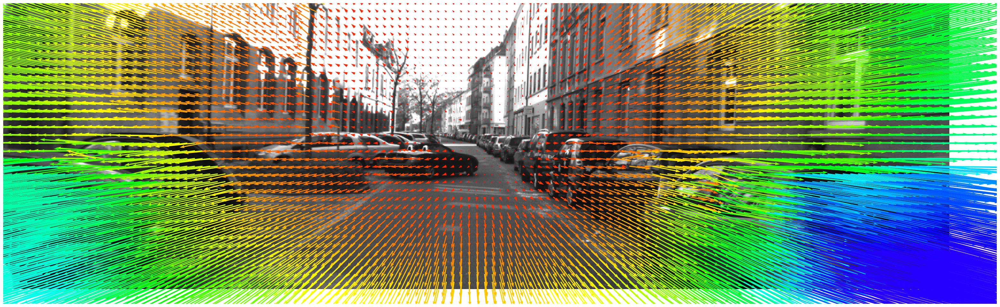

<Figure size 640x480 with 0 Axes>

In [4]:

plot_optical_flow_color(u,v,im1,'./Results/outFlow_arrowplot.png')

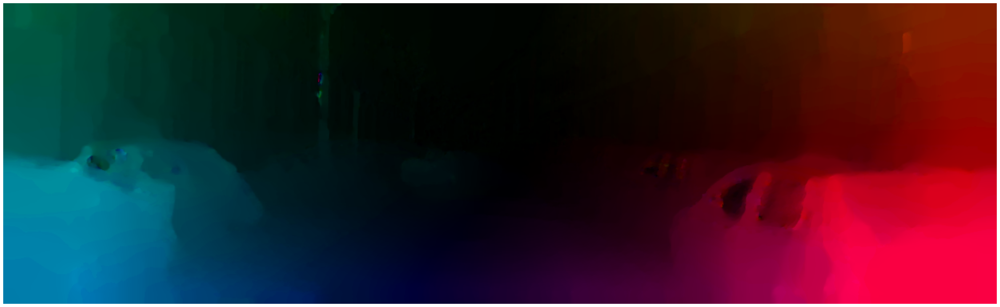

In [5]:

plot_optical_flow_dense(u,v,im1,'./Results/outFlow_arrowplot.png')

Constructing pyramid...Time Taken: 202.25 seconds for image of size (1080, 1920, 3)
done!
Pyramid level 14
Pyramid level 13
Pyramid level 12
Pyramid level 11
Pyramid level 10
Pyramid level 9
Pyramid level 8
Pyramid level 7
Pyramid level 6
Pyramid level 5
Pyramid level 4
Pyramid level 3
Pyramid level 2
Pyramid level 1
Pyramid level 0
Constructing pyramid...Time Taken: 177.75 seconds for image of size (1080, 1920, 3)
done!
Pyramid level 14
Pyramid level 13
Pyramid level 12
Pyramid level 11
Pyramid level 10
Pyramid level 9
Pyramid level 8
Pyramid level 7
Pyramid level 6
Pyramid level 5
Pyramid level 4
Pyramid level 3
Pyramid level 2
Pyramid level 1
Pyramid level 0


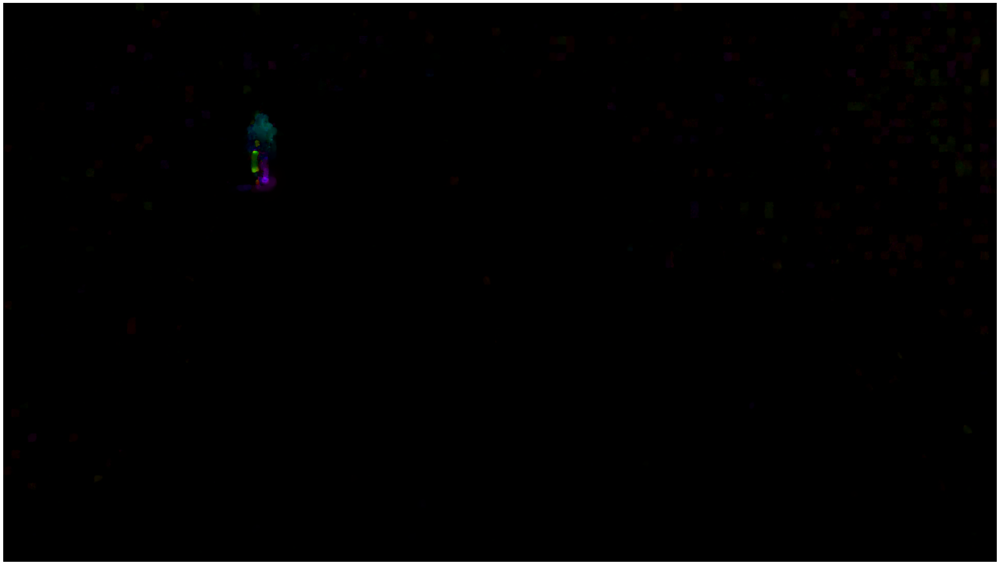

In [15]:
video_path = '../datasets/AICity_data/train/S03/c010/vdo.avi'
output_gif_filename = 'test.gif'
cap = cv2.VideoCapture(video_path)
count = 0
prev_frame = None
video_frames_out = []
while cap.isOpened():
    ret,frame = cap.read()
    if prev_frame is None:
        prev_frame = frame
        continue
    optical_flow = compute_OF_pyflow(prev_frame, frame)
    u = optical_flow[:,:,0]
    v = optical_flow[:,:,1]

    fig=generate_dense_fig(u,v,prev_frame,'./Results/outFlow_arrowplot.png')
    count = count + 1
    prev_frame = frame.copy()
    if count==2:
        break
    
    frame_out = fig2img(fig)
    video_frames_out.append(frame_out)
    plt.close(fig)
video_frames_out[0].save(output_gif_filename, save_all=True, append_images=video_frames_out[1:], duration=30, loop=0)

cap.release()

##GMFlow
#Setup (only run the first time)


In [16]:
# get the code 
!git clone https://github.com/autonomousvision/unimatch
%cd /content/unimatch
%bash pip_install.sh

# we assume the downloaded model weights are located under the pretrained directory.
%mkdir pretrained
# we provide a large number of model weights with different speed-accuracy trade-off trained on different datasets for downloading: 
# https://github.com/autonomousvision/unimatch/blob/master/MODEL_ZOO.md
# download example weights for flow, stereo and depth
!wget -P pretrained https://s3.eu-central-1.amazonaws.com/avg-projects/unimatch/pretrained/gmflow-scale2-regrefine6-mixdata-train320x576-4e7b215d.pth
!wget -P pretrained https://s3.eu-central-1.amazonaws.com/avg-projects/unimatch/pretrained/gmflow-scale2-regrefine6-kitti15-25b554d7.pth

--2023-04-06 18:36:07--  https://s3.eu-central-1.amazonaws.com/avg-projects/unimatch/pretrained/gmflow-scale2-regrefine6-mixdata-train320x576-4e7b215d.pth
Resolving s3.eu-central-1.amazonaws.com (s3.eu-central-1.amazonaws.com)... 52.219.75.39
Connecting to s3.eu-central-1.amazonaws.com (s3.eu-central-1.amazonaws.com)|52.219.75.39|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 29500177 (28M) [binary/octet-stream]
Saving to: ‘pretrained/gmflow-scale2-regrefine6-mixdata-train320x576-4e7b215d.pth’

gmflow-scale2-regre 100%[===================>]  28.13M  3.22MB/s    in 9.4s    

2023-04-06 18:36:17 (3.01 MB/s) - ‘pretrained/gmflow-scale2-regrefine6-mixdata-train320x576-4e7b215d.pth’ saved [29500177/29500177]

--2023-04-06 18:36:18--  https://s3.eu-central-1.amazonaws.com/avg-projects/unimatch/pretrained/gmflow-scale2-regrefine6-kitti15-25b554d7.pth
Resolving s3.eu-central-1.amazonaws.com (s3.eu-central-1.amazonaws.com)... 52.219.72.88
Connecting to s3.eu-central-1

In [24]:
import torch

print('PyTorch version: %s' % torch.__version__)

if not torch.cuda.is_available():
  print('Running on CPU')
else:
  print('Runing on GPU %s' % torch.cuda.get_device_name())

# inference on images
#--inference_video ../datasets/AICity_data/train/S03/c010/vdo.avi \
# script from: https://github.com/autonomousvision/unimatch/blob/master/scripts/gmflow_demo.sh
!python unimatch/main_flow.py \
--inference_dir ./img_flow_input \
--resume pretrained/gmflow-scale2-regrefine6-kitti15-25b554d7.pth \
--output_path ./Results/gmflow \
--padding_factor 32 \
--upsample_factor 4 \
--num_scales 2 \
--attn_splits_list 2 8 \
--corr_radius_list -1 4 \
--prop_radius_list -1 1 \
--reg_refine \
--num_reg_refine 6 \
--save_flo_flow

PyTorch version: 1.9.0+cu102
Running on CPU
/home/neru/M5/lib/python3.9/site-packages/torch/cuda/__init__.py:52: UserWarning: CUDA initialization: The NVIDIA driver on your system is too old (found version 10010). Please update your GPU driver by downloading and installing a new version from the URL: http://www.nvidia.com/Download/index.aspx Alternatively, go to: https://pytorch.org to install a PyTorch version that has been compiled with your version of the CUDA driver. (Triggered internally at  /pytorch/c10/cuda/CUDAFunctions.cpp:115.)
  return torch._C._cuda_getDeviceCount() > 0
Load checkpoint: pretrained/gmflow-scale2-regrefine6-kitti15-25b554d7.pth
2 images found
/home/neru/M5/lib/python3.9/site-packages/torch/_tensor.py:575: UserWarning: floor_divide is deprecated, and will be removed in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values.
To keep the current behavior, use torch

In [28]:
#read .flo file
flow_path = './Results/gmflow/000045_10_pred.flo'
with open(flow_path, 'rb') as f:
    magic = np.fromfile(f, np.float32, count=1)
    if 202021.25 != magic:
        print('Magic number incorrect. Invalid .flo file')
    else:
        w = np.fromfile(f, np.int32, count=1)[0]
        h = np.fromfile(f, np.int32, count=1)[0]
        print('Reading %d x %d flo file' % (w, h))
        data = np.fromfile(f, np.float32, count=2*w*h)
        # Reshape data into 3D array (columns, rows, bands)
        data2D = np.resize(data, (h, w, 2))
u = data2D[:,:,0]
v = data2D[:,:,1]


Reading 1241 x 376 flo file


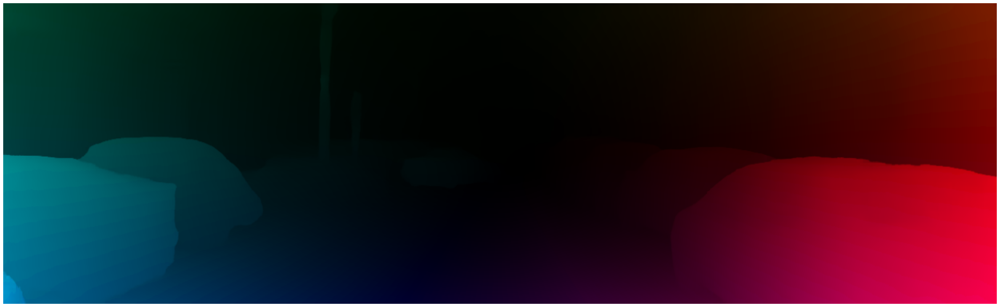

In [29]:
plot_optical_flow_dense(u,v,im1,'./Results/outFlow_arrowplot2.png')

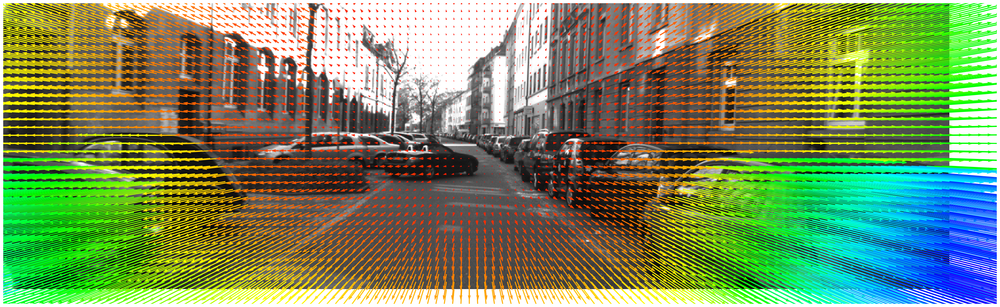

<Figure size 640x480 with 0 Axes>

In [30]:

plot_optical_flow_color(u,v,im1,'./Results/outFlow_arrowplot.png')

In [33]:

msen, pepn, _ = optical_flow_metrics_pred(data2D, '000045_10.png')

MSEN for image 000045_10.png: 0.2359
PEPN for image 000045_10.png: 0.3086%
